# Football keypoints detector model training

## Before You start

### Configure API keys

- Open your [Kaggle setting](https://www.kaggle.com/settings) and click **"Create New Token"**. File **kaggle.json** will be downloaded.
- Create **.env** file in **content** directory.
- Copy your **username** and **key** into **.env**. It should look like this

```
USERNAME=<your username>
KEY=<your key>
```

### Ensure that you have access to GPU

In [ ]:
!nvidia-smi

## Prepare environment

In [ ]:
!pip install kaggle ultralytics python-dotenv

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/football-analytics/runs

In [3]:
import kagglehub
import shutil
import pandas as pd
import yaml
import os
import cv2
import seaborn as sns
from dotenv import load_dotenv
from matplotlib import pyplot as plt
from IPython.display import Image, display
from ultralytics import YOLO

## Download dataset

In [ ]:
dataset_id = "danielmachniak/football-pitch-keypoints-detection"

download_path = kagglehub.dataset_download(dataset_id)
dest_path = "./football-analytics/data/raw/"

shutil.move(download_path, dest_path)

## Data analysis

### Raw image

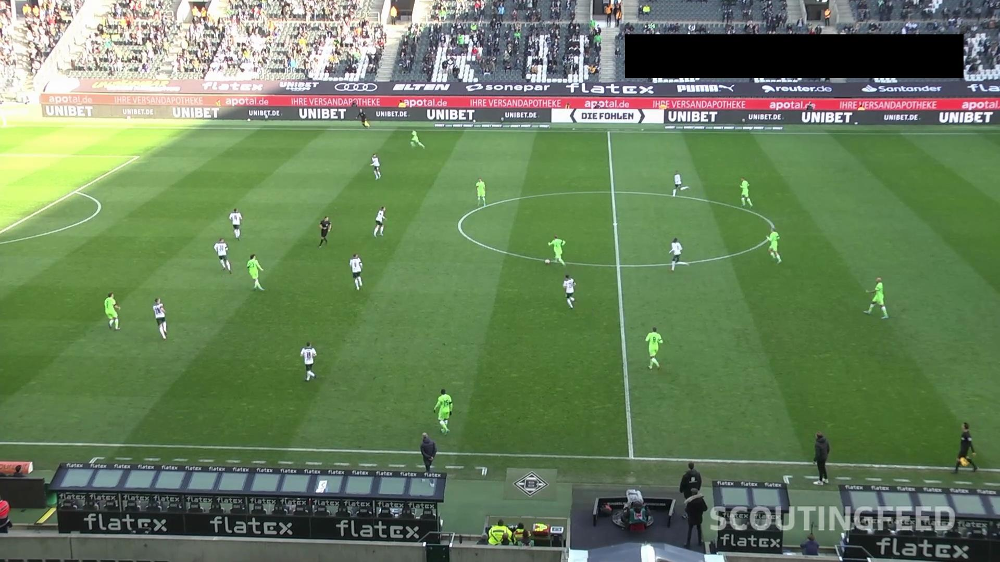

In [34]:
raw_data_path = dest_path + "football-pitch-keypoints-detection/"

train_images_path = raw_data_path + "train/images/"
images = sorted(os.listdir(train_images_path))

raw_image_path = train_images_path + images[0]

display(Image(raw_image_path))

### Labels format

In [35]:

with open("./football-analytics/data/raw/football-pitch-keypoints-detection/data.yaml") as f:
    data_info = yaml.safe_load(f)

train_labels_path = raw_data_path + "train/labels/"
labels_filenames = sorted(os.listdir(train_labels_path))

label_path = train_labels_path + labels_filenames[0]

labels = pd.read_csv(
  label_path,
  delimiter=" ",
  header=None
)

labels

,0,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,100
0,0,0.5,0.527906,1,0.642473,0.002321,0.219072,2,0.02381,0.397032,...,0,0.97619,0.787955,0,0.459913,0.401384,2,0.774974,0.409107,2


YOLO pose format is:
```
<class-index> <x> <y> <width> <height> <px1> <py1> <p1-visibility> <px2> <py2> <p2-visibility> <pxn> <pyn> <p2-visibility>
```
Coordinates are in normalized format (from 0 to 1). To get actual values dimensions should be resized by the image dimensions.

### Key points annotation on raw image

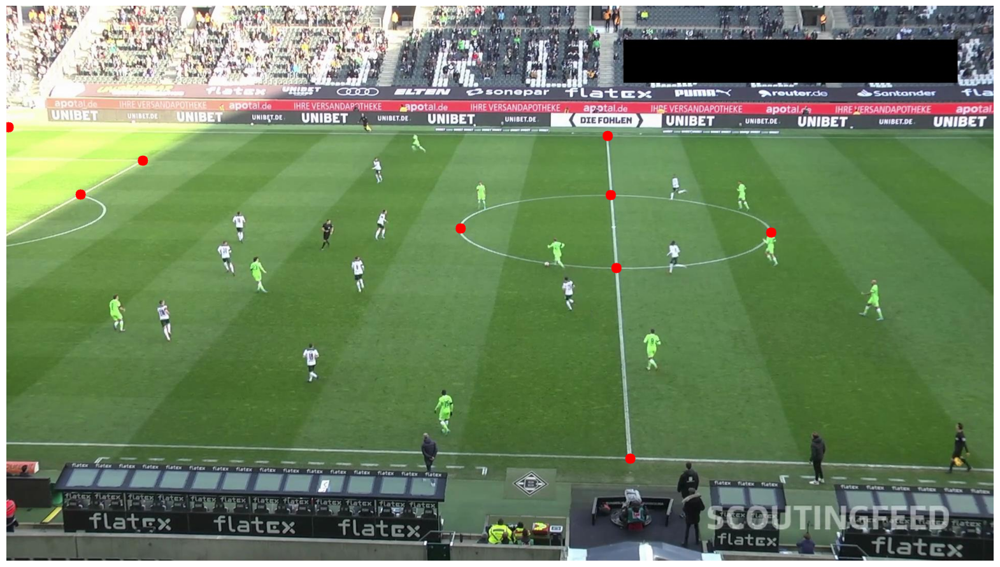

In [36]:
annotated_image = cv2.imread(raw_image_path)
annotated_image = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)

image_height, image_width = annotated_image.shape[:2]

keypoints = labels.values.flatten()[5:]


for i in range(0, len(keypoints), 3):
  px = int(keypoints[i] * image_width)
  py = int(keypoints[i+1] * image_height)
  visibility = keypoints[i+2]

  if visibility >= 1:
    cv2.circle(annotated_image, (px, py), 10, (255, 0, 0), -1)

plt.figure(figsize=[20, 20])
plt.imshow(annotated_image)
plt.axis("off")
plt.show()


## Data processing

### Resized image to 640x640

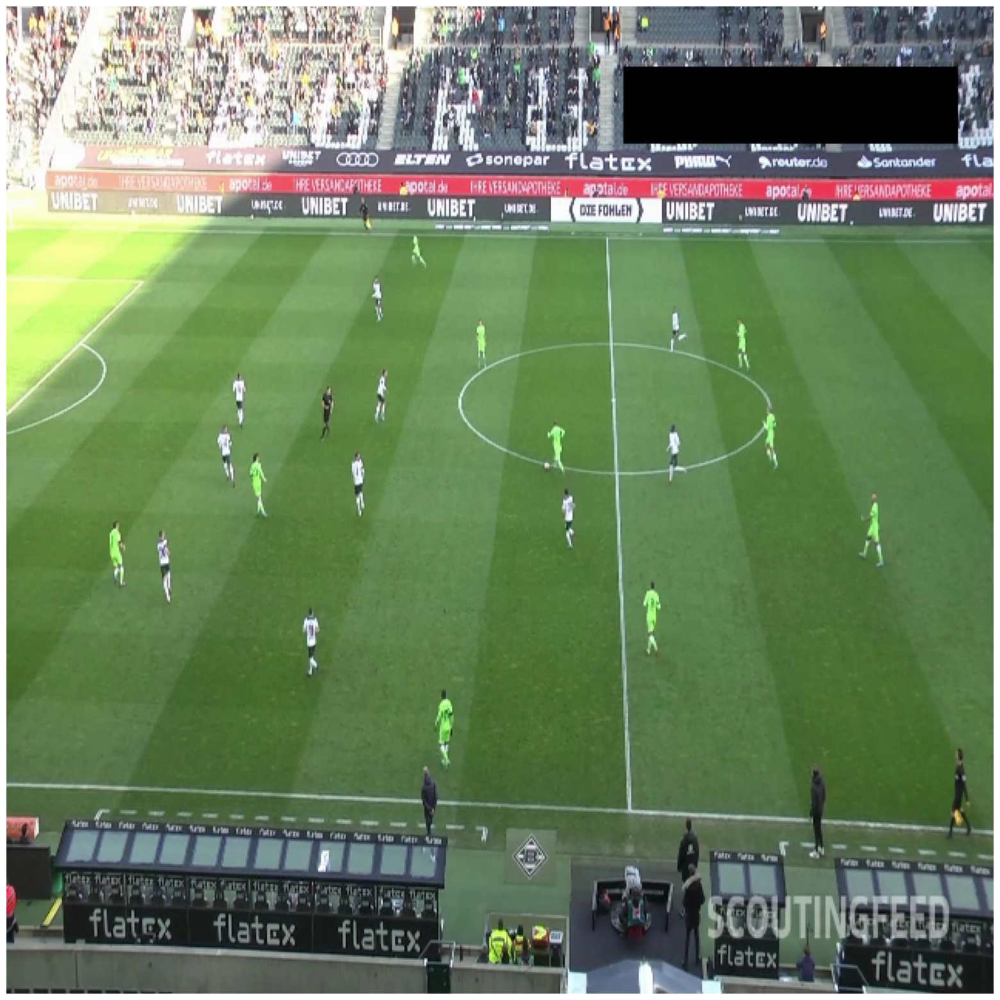

In [37]:
img = cv2.imread(raw_image_path)
resized_img = cv2.resize(img, (640, 640))

plt.figure(figsize = [20,20])
plt.imshow(resized_img[:,:,::-1])
plt.axis("off")
plt.show()

### Data processing

In [38]:
processed_data_path = "./football-analytics/data/processed/football-pitch-keypoints-detection/"

os.makedirs(processed_data_path, exist_ok=True)
shutil.copy(raw_data_path + "data.yaml", processed_data_path)

target_size = 640

subdirs = ["train", "test", "valid"]

for subdir in subdirs:
  raw_images_dir = os.path.join(raw_data_path, subdir, 'images')
  raw_labels_dir = os.path.join(raw_data_path, subdir, 'labels')

  processed_images_dir = os.path.join(processed_data_path, subdir, 'images')
  processed_labels_dir = os.path.join(processed_data_path, subdir, 'labels')

  os.makedirs(processed_images_dir, exist_ok=True)
  os.makedirs(processed_labels_dir, exist_ok=True)

  for filename in os.listdir(raw_images_dir):
    if filename.endswith(('.jpg', '.jpeg', '.png')):
      img_path = os.path.join(raw_images_dir, filename)
      label_path = os.path.join(raw_labels_dir, filename.replace('.jpg', '.txt').replace('.jpeg', '.txt').replace('.png', '.txt'))

      img = cv2.imread(img_path)
      original_height, original_width, _ = img.shape
      resized_img = cv2.resize(img, (target_size, target_size))
      cv2.imwrite(os.path.join(processed_images_dir, filename), resized_img)

      if os.path.exists(label_path):
        shutil.copy(label_path, os.path.join(processed_labels_dir, filename.replace('.jpg', '.txt').replace('.jpeg', '.txt').replace('.png', '.txt')))

### Processed image

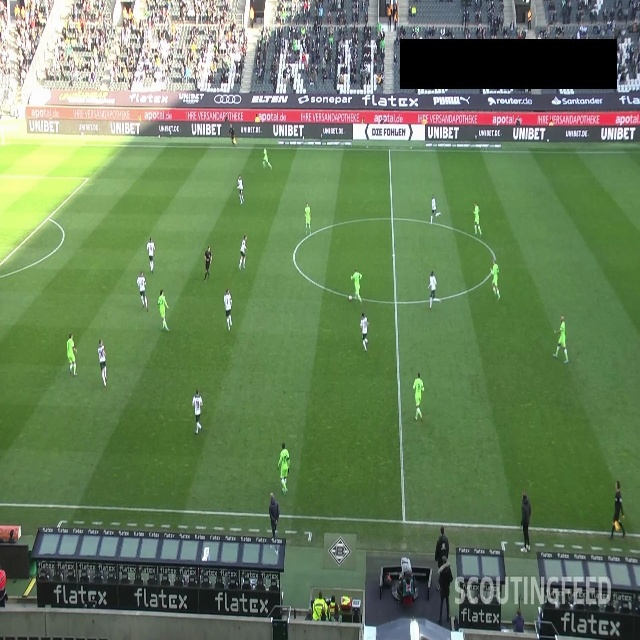

In [40]:
images = sorted(os.listdir(processed_data_path + "train/images/"))

processed_image_path = processed_data_path + "train/images/" + images[0]

display(Image(processed_image_path))

### Key points annotation on processed image

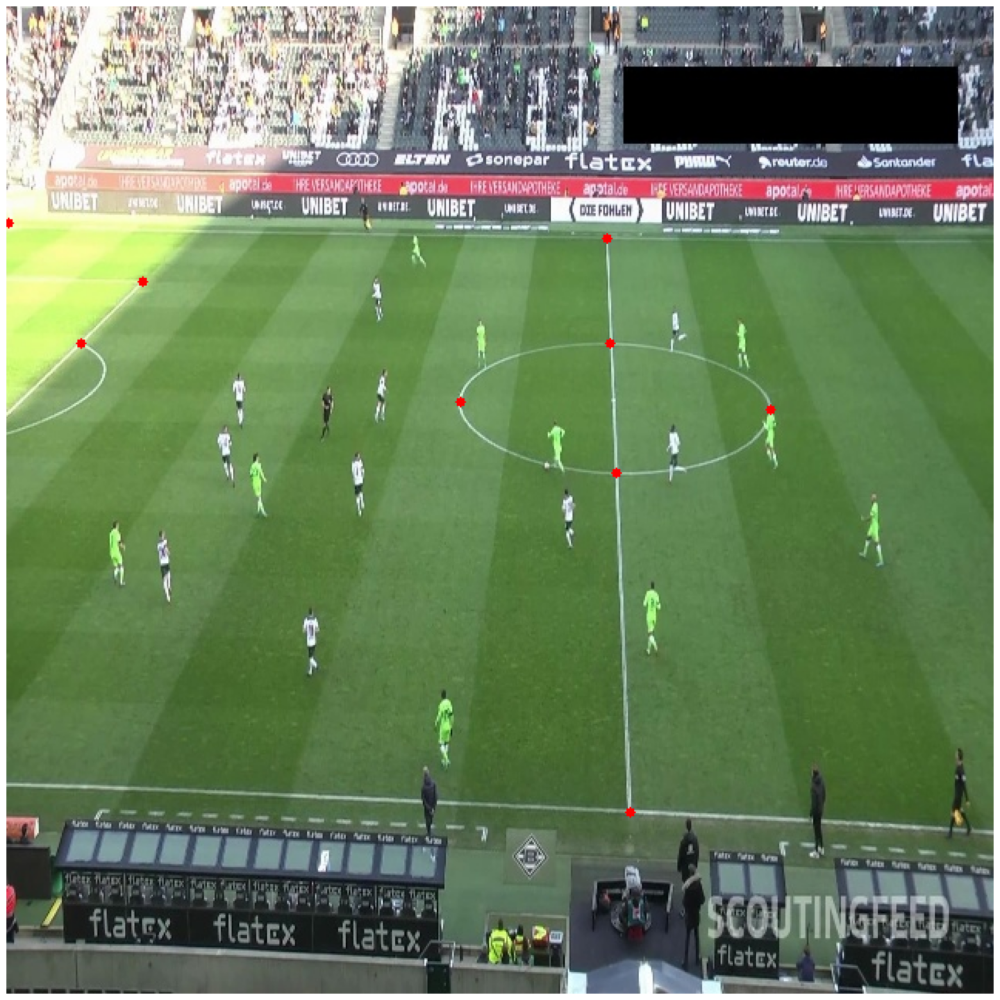

In [41]:
annotated_image = cv2.imread(processed_image_path)
annotated_image = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)

image_height, image_width = annotated_image.shape[:2]

keypoints = labels.values.flatten()[5:]


for i in range(0, len(keypoints), 3):
  px = int(keypoints[i] * image_width)
  py = int(keypoints[i+1] * image_height)
  visibility = keypoints[i+2]

  if visibility >= 1:
    cv2.circle(annotated_image, (px, py), 3, (255, 0, 0), -1)

plt.figure(figsize=[20, 20])
plt.imshow(annotated_image)
plt.axis("off")
plt.show()

## Model fine-tuning

In [ ]:
model = YOLO("yolo11m-pose.pt")

In [ ]:
%cd /content/football-analytics/

model.train(
  task="pose",
  data="/content/football-analytics/data/processed/football-pitch-keypoints-detection/data.yaml",
  epochs=200,
  patience=50,
  batch=0.8,
  imgsz=640,
  mosaic=0.0,
  plots=True
)


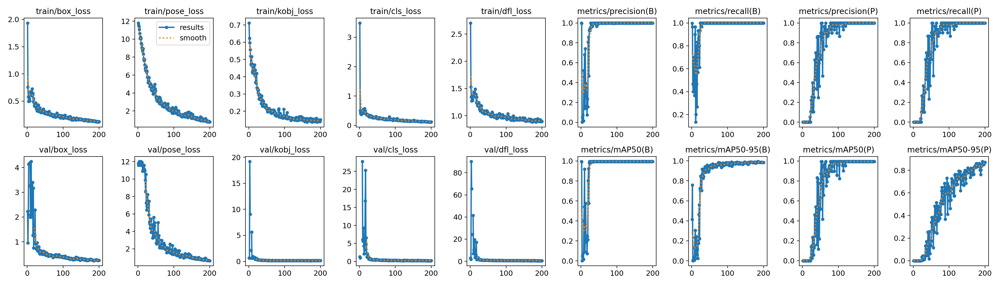

In [51]:
Image(
    filename="/content/football-analytics/runs/pose/train/results.png"
)

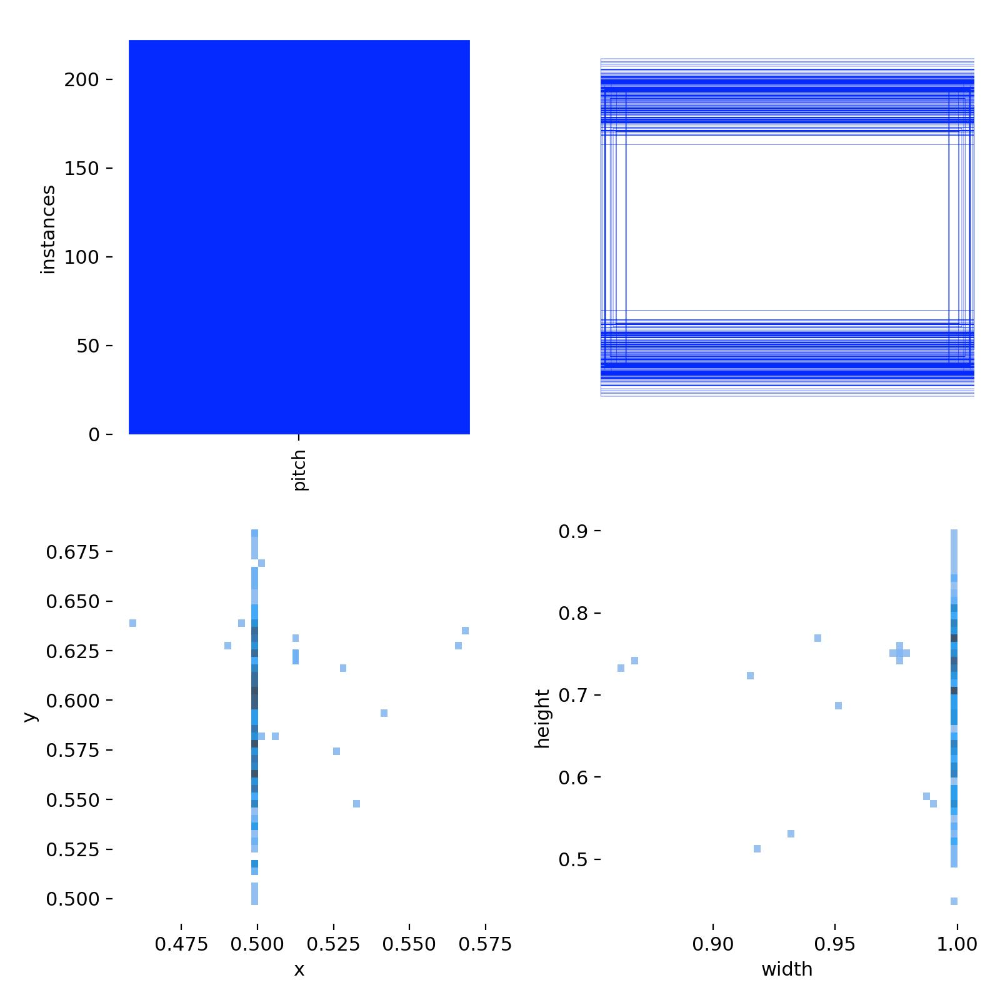

In [12]:
Image(
    filename="/content/football-analytics/runs/pose/train/labels.jpg"
)

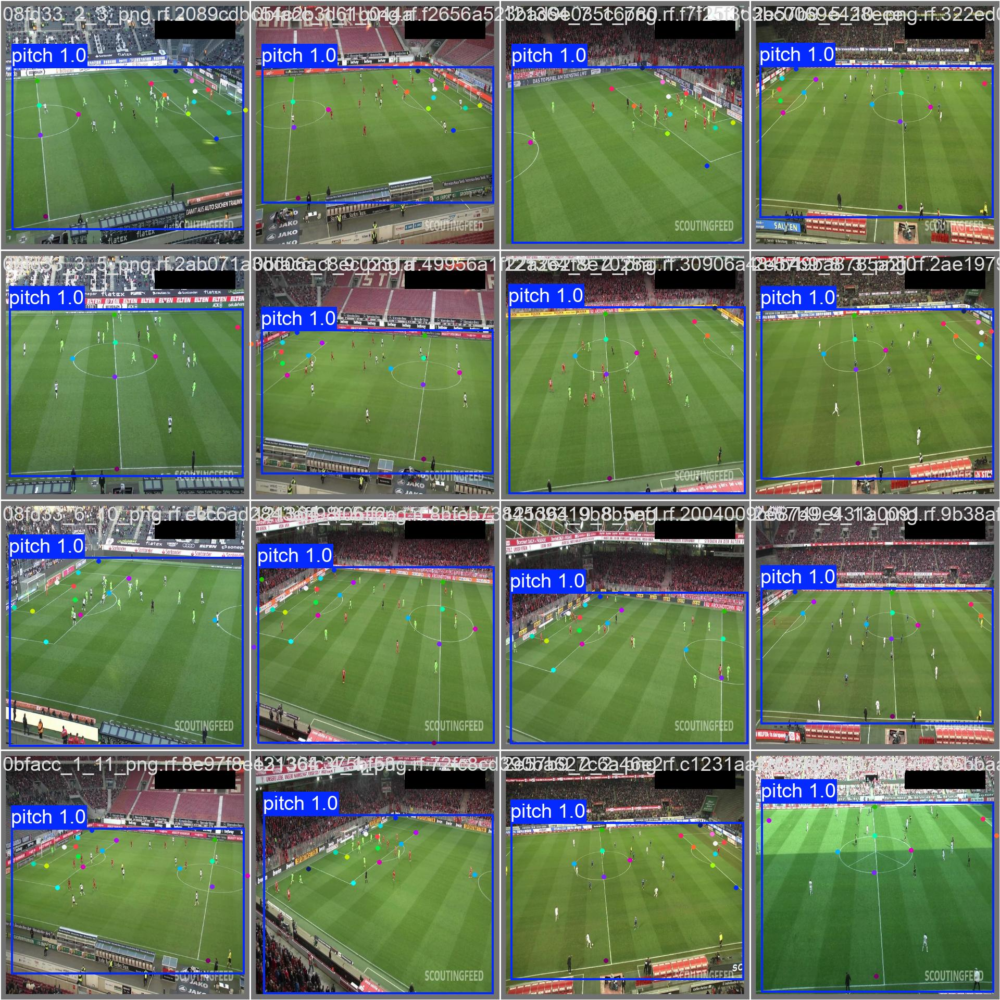

In [52]:
Image(
    filename="/content/football-analytics/runs/pose/train/val_batch0_pred.jpg"
)

## Model validation

In [53]:
model = YOLO("/content/football-analytics/runs/pose/train/weights/best.pt")

In [54]:
metrics = model.val()

Ultralytics 8.3.28 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (NVIDIA L4, 22478MiB)
YOLO11m-pose summary (fused): 322 layers, 21,414,067 parameters, 0 gradients, 73.8 GFLOPs


val: Scanning /content/football-analytics/data/processed/football-pitch-keypoints-detection/valid/labels.cache... 30 images, 0 backgrounds, 0 corrupt: 100%|██████████| 30/30 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.14it/s]


                   all         30         30          1          1      0.995      0.983          1          1      0.995      0.877
Speed: 0.2ms preprocess, 14.5ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/pose/val


In [ ]:
model.predict(
    "/content/football-analytics/data/processed/football-pitch-keypoints-detection/test/images",
    save=True
)

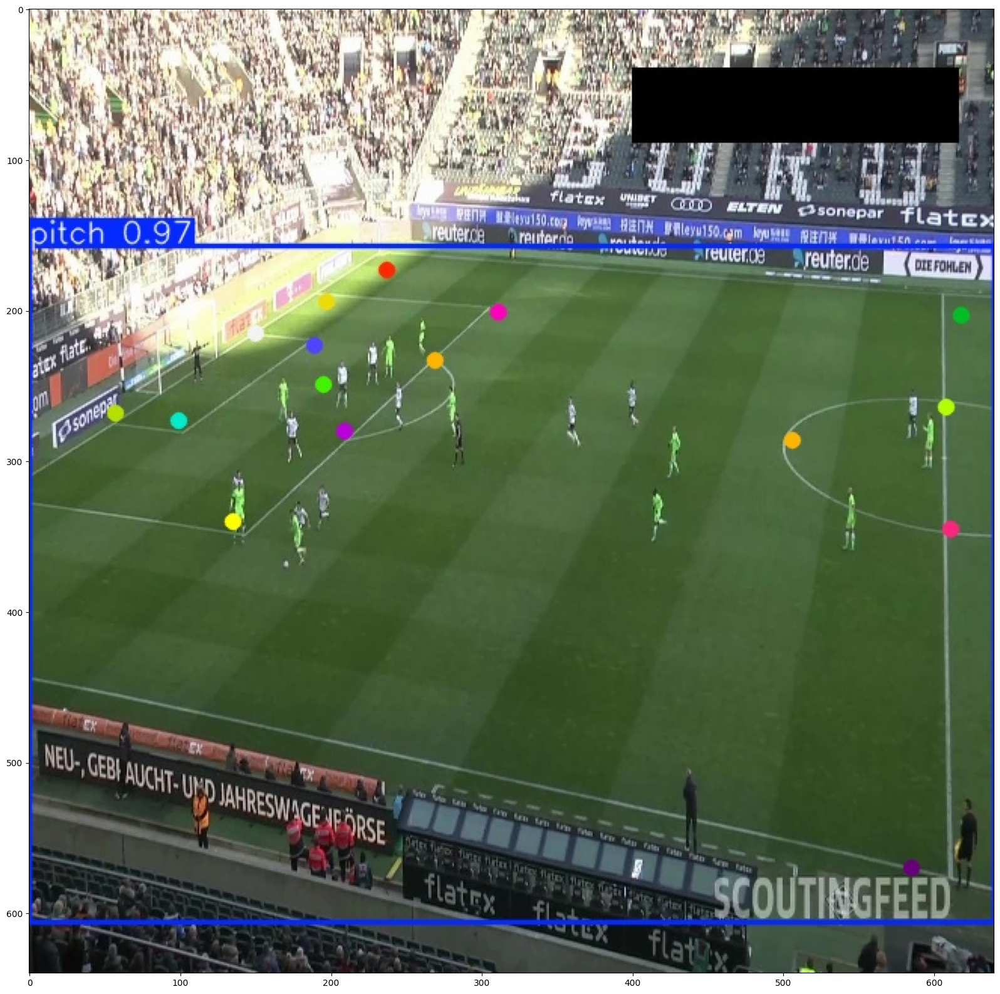

In [56]:
predict_dir = "/content/football-analytics/runs/pose/predict/"

predicted_images = sorted(os.listdir(predict_dir))

img = cv2.imread(predict_dir + predicted_images[0])

plt.figure(figsize = [20,20])
plt.imshow(img[:,:,::-1])

## Model upload

In [ ]:
%cd /content

SRC_MODEL_DIR = '/content/football-analytics/runs/pose/train/weights/best.pt'
LOCAL_MODEL_DIR = '/content/football-analytics/runs/pose/train/weights/football-pitch-keypoints-detector-m.pt'

shutil.move(SRC_MODEL_DIR, LOCAL_MODEL_DIR)

load_dotenv()
kagglehub.auth.set_kaggle_credentials(
    os.getenv("USERNAME"),
    os.getenv("KEY")
)

MODEL_SLUG = 'football-pitch-keypoints-detector' # Replace with model slug.

# Learn more about naming model variations at
# https://www.kaggle.com/docs/models#name-model.
VARIATION_SLUG = 'm' # Replace with variation slug.

kagglehub.model_upload(
  handle = f"danielmachniak/{MODEL_SLUG}/pyTorch/{VARIATION_SLUG}",
  local_model_dir = LOCAL_MODEL_DIR,
  version_notes = 'Upload fine-tuned model')